In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import random

from PIL import Image, ImageDraw
from collections import Counter
from sklearn.model_selection import train_test_split


In [3]:
import torchvision
import torch

from torchvision import transforms as tf
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

In [4]:
train_dir = os.path.join("wally dset v2.v10i.tensorflow", "train")
train_CSV_dir = os.path.join("wally dset v2.v10i.tensorflow", "train", "_annotations.csv")
train = pd.read_csv(train_CSV_dir)
train.head()

,filename,width,height,class,xmin,ymin,xmax,ymax
0,Selection_014013_jpg.rf.2f7c83e72260484ca45ffb...,64,64,waldo,13,11,45,48
1,Selection_00144254_jpg.rf.24f8b461d2b246f4023b...,64,64,waldo,22,16,39,34
2,Selection_00144254_jpg.rf.2a0c08faa1993e51968a...,64,64,waldo,22,16,39,34
3,selection_1949494_jpg.rf.02d7459c932574b881597...,64,64,waldo,35,19,49,38
4,9_9_5_jpg.rf.073918a122842561ea232dcff52a4961.jpg,64,64,waldo,42,25,60,48


In [5]:
coordinates = pd.DataFrame(list(zip(train.xmin.values, train.ymin.values, train.xmax.values, train.ymax.values)), columns=["x1", "y1", "x2", "y2"])
coordinates.head()

,x1,y1,x2,y2
0,13,11,45,48
1,22,16,39,34
2,22,16,39,34
3,35,19,49,38
4,42,25,60,48


In [6]:
df = pd.concat([train, coordinates], axis=1)
df.drop(["width", "height", "class", "xmin", "ymin", "xmax", "ymax"], axis=1, inplace=True)
df.head()

,filename,x1,y1,x2,y2
0,Selection_014013_jpg.rf.2f7c83e72260484ca45ffb...,13,11,45,48
1,Selection_00144254_jpg.rf.24f8b461d2b246f4023b...,22,16,39,34
2,Selection_00144254_jpg.rf.2a0c08faa1993e51968a...,22,16,39,34
3,selection_1949494_jpg.rf.02d7459c932574b881597...,35,19,49,38
4,9_9_5_jpg.rf.073918a122842561ea232dcff52a4961.jpg,42,25,60,48


In [7]:
imgList = df.filename.unique()


In [8]:
class waldoData(torch.utils.data.Dataset):
    def __init__(self, dataframe, imgsList, indices):
        self.df = dataframe
        self.imgsList = imgsList
        self.indices = indices

    def __len__(self):
        return len(self.indices)
    
    def __getitem__(self, index):
        getIMG_name = self.imgsList[self.indices[index]]
        box = self.df[self.df.filename == getIMG_name].values[:, 1:].astype("int")
        
        img_type = ".jpg"
        getIMG_dir = os.path.join("wally dset v2.v10i.tensorflow", "train", getIMG_name)
        img = Image.open(getIMG_dir).convert("RGB")
        labels = torch.ones((box.shape[0]), dtype=torch.int64)
        target = {}
        target["boxes"] = torch.tensor(box)
        target["label"] = labels

        output = tf.ToTensor()(img), target

        return output

In [9]:
training_set, testing_set = train_test_split(range(imgList.shape[0]), test_size=0.2)
def custom_collate(batch):
    return batch

In [10]:
def createDataloader(className, dataframe, imgsList, d_set, batch_size):
    outputLoader = torch.utils.data.DataLoader(className(dataframe, imgsList, d_set), 
                                               batch_size=batch_size, collate_fn=custom_collate, 
                                               pin_memory=True if torch.cuda.is_available() else False)
    return outputLoader

training_dataloader = createDataloader(waldoData, df, imgList, training_set, 16)
validation_dataloader = createDataloader(waldoData, df, imgList, testing_set, 8)

In [11]:
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)


/opt/homebrew/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/homebrew/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [12]:
num_classes = 2
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(in_features, num_classes)

device = torch.device("cpu")

optimizer = torch.optim.SGD(model.parameters(), lr=0.005, momentum=0.9, weight_decay=0.0005)
epochs_amount = 10

In [17]:
model.to(device)

for e in range(epochs_amount):
    e_loss = 0
    for data in training_dataloader:
        imgs = []
        targets = []
        for item in data:
            imgs.append(item[0].to(device))
            loopTarg = {}
            loopTarg["boxes"] = item[1]["boxes"].to(device)
            loopTarg["labels"] = item[1]["label"].to(device)
            targets.append(loopTarg)
        
        loss_dictionary = model(imgs, targets)
        loss_value = sum(x for x in loss_dictionary.values())
        e_loss += loss_value.cpu().detach().numpy()
        optimizer.zero_grad()
        loss_value.backward()
        optimizer.step()
    print(f"{e} -- Epoch Loss: {e_loss}")

0 -- Epoch Loss: 3.148575931787491
1 -- Epoch Loss: 1.352726086974144
2 -- Epoch Loss: 1.1338876634836197
3 -- Epoch Loss: 1.1174579858779907
4 -- Epoch Loss: 1.0771733671426773
5 -- Epoch Loss: 1.0232642740011215
6 -- Epoch Loss: 1.0410807877779007
7 -- Epoch Loss: 1.0024806708097458
8 -- Epoch Loss: 0.9515026807785034
9 -- Epoch Loss: 0.9133481830358505


In [18]:
model.eval()
data = next(iter(validation_dataloader))

In [20]:
imgExtr = data[0][0]
boxExtr = data[0][1]["boxes"]
labelsExtr = data[0][1]["label"]


In [29]:
output = model([imgExtr.to(device)])

outputBoundaryBox = output[0]["boxes"]
outputScores = output[0]["scores"]


In [31]:
keep = torchvision.ops.nms(outputBoundaryBox, outputScores, 0.45)

outputBoundaryBox.shape
keep.shape

torch.Size([8])

In [50]:
imgPermutation = (imgExtr * 255).permute(1, 2, 0).cpu().detach().numpy().astype("uint8")
vSample = Image.fromarray(imgPermutation)

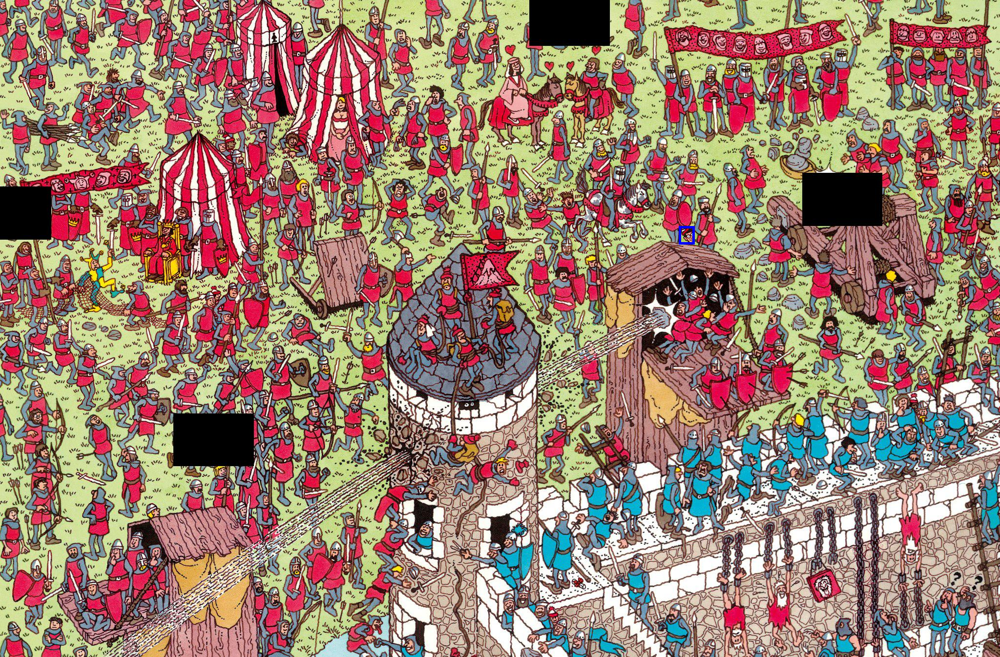

In [51]:
draw = ImageDraw.Draw(vSample)
for b in boxExtr:
    draw.rectangle(list(b), fill=None, outline="blue", width=5)

vSample